# CMB map analysis with ``pixell``
## A lightning tour

This tutorial will show you how to manipulate and analyze CMB maps. We'll work with a real map of the microwave sky obtained by the Atacama Cosmology Telescope and publicly released in 2014. That release included maps of many regions of the sky in both temperature and polarization. We will just work with the temperature map in a small but deep region of the sky, referred to by ACT as "Deep6".

If you want to run this notebook, please place the map in the same directory as this notebook.

Most of the map manipulation functions are in ``pixell.enmap``, so let's load that along with ``numpy`` and ``matplotlib``.

In [1]:
from __future__ import print_function
%load_ext autoreload
%autoreload 2
from pixell import enmap,utils
import numpy as np
import matplotlib.pyplot as plt
import os,sys
import urllib.request

/home/msyriac/repos/pixell/pixell/enmap.py:495: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if wrap is "auto":
/home/msyriac/repos/pixell/pixell/enmap.py:1481: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if value is "auto":
/home/msyriac/repos/pixell/pixell/enmap.py:1488: SyntaxWarning: "is" with a literal. Did you mean "=="?
  elif value is "none":


In [71]:
# Download some files for the tutorial if they don't already exist.
# This might take a while.
# Couple 100 megabytes at most
deep6_file_name = "ACTPol_148_D6_PA1_S1_1way_I.fits"
deep56_file_name = "ACTPol_148_D56_PA2_S2_1way_I.fits"
catalog_name = "E-D56Clusters.fits"
planck_file_name =  "HFI_SkyMap_143_2048_R2.02_full.fits" # 2GB file!
links = [[deep6_file_name,f"https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_maps/{deep6_file_name}"],
         [catalog_name,"https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_lensing/{catalog_name}"],[deep56_file_name,f"https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_maps/{deep56_file_name}"],[planck_353_file_name,f"https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/maps/{planck_353_file_name}"]]
for fname,link in links: urllib.request.urlretrieve(link, fname) if not(os.path.exists(fname)) else None

## Reading in a map and inspecting it

In pixell, a map is encapsulated in an `ndmap`, which combines two objects: a numpy array (of at least two dimensions) whose two trailing dimensions correspond to two coordinate axes of the map, and a `wcs` object that specifies the World Coordinate System. The `wcs` component is an instance of Astropy’s `astropy.wcs.wcs.WCS class`. The combination of the `wcs` and the `shape` of the numpy array completely specifies the footprint of a map of the sky, and is called the geometry. pixell helps with manipulation of ndmap objects in ways that are aware of and preserve the validity of the `wcs` information.

pixell can read in rectangular pixelization maps stored with WCS info from either FITS files or HDF files. You are most likely to encounter FITS files. Either of these can be opened with the `read_map` function in the `pixell.enmap` module. Once loaded, you can inspect the usual properties that `numpy` arrays have:

In [4]:
imap = enmap.read_map(deep6_file_name)
print(imap.shape, imap.dtype)


(1505, 3521) float64


An ndmap must have at least two dimensions. The two right-most axes represent celestial coordinates (typically Declination and Right Ascension). Maps can have arbitrary number of leading dimensions, but many of the pixell CMB-related tools interpret 3D arrays with shape (ncomp,Ny,Nx) as representing Ny x Nx maps of intensity, polarization Q and U Stokes parameters, in that order.

The map we just loaded in is a CMB temperature/intensity map, so it is single component. It has shape (1505,3521) which means it has 1505 pixels in the Y-direction (which is declination, since the coordinate system used by ACT and most ground-based experiments is Equatorial) and 3521 pixels in the X-direction (which is right ascension in the Equatorial coordinate system).

But as an extension of numpy arrays, `ndmap` objects also contain the WCS object which you can inspect:

In [5]:
print(imap.wcs)

cea:{cdelt:[-0.008333,0.008333],crval:[0,0],crpix:[5832,1302],pv[2,1]=1}


You'll typically not need to worry about what those WCS keys mean; that's what pixell is here for! But it's  useful to know that the wcs information describes the correspondence between celestial coordinates (typically the Right Ascension and Declination in the Equatorial system) and the pixel indices in the two right-most axes. In some projections, such as CEA or CAR, rows (and columns) of the pixel grid will often follow lines of constant Declination (and Right Ascension). In other projections, this will not be the case.

ACT maps have been in CEA in the past and will be in CAR in the future. Again, pixell lets you be agnostic to the minor differences between these projections.

pixell.enmap contains many functions for manipulating and getting information on these maps. pixell.utils contains miscellaneous utilities. Here's an example of how to obtain the bounding box of a map and convert it to degrees (all units in pixell are by default in radians).

In [6]:
enmap.box(imap.shape,imap.wcs)/utils.degree

array([[-10.91167335,  48.59583333],
       [  1.69608103,  19.25416667]])

You can also convert radians to degrees with:

In [7]:
print(np.rad2deg(imap.box()))

[[-10.91167335  48.59583333]
 [  1.69608103  19.25416667]]


Interpreting the above requires us to know some conventions pixell uses. The above is a coordinate bounding box. Since pixell orders coordinates as

Y,X <-> (dec, ra)

The bounding box has convention,
[[dec_from,ra_from],[[dec_to,ra_to]]

Later we will encounter pixel boxes, which specify bounding boxes in pixel index units. These have a similar convention.

## Visualizing maps with ``pixell.enplot``

One way to visualize maps is using matplotlib.imshow

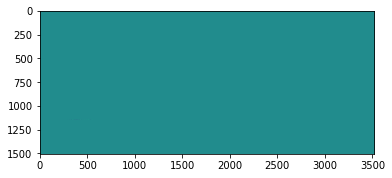

In [8]:
plt.imshow(imap)

Ok, so it didn't automatically learn the color scale very well. Let's explicitly specify it since the map is in microKelvin units and the CMB has fluctuations ~300 muK

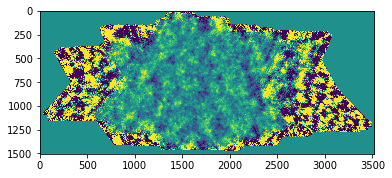

In [9]:
plt.imshow(imap,vmin=-300,vmax=300)

matplotlib does some interpolation and downgrading which doesn't make the plot very pretty or useful. pixell has a module called enplot which uses the Python Image Library (PIL) to improve the situation. You will need to do

```
pip install Pillow --user
```

to have the following work.

We first import the enplot module and create a `plots` object from the map we just loaded. We set the range to 300 muK and ask enplot to mask zero values in the map.

In [10]:
from pixell import enplot
plots = enplot.plot(imap,range=300,mask=0)

Ok, that made the plots object. Now I can either "show" it here, or save it to disk as a PNG file. Let's first show it inline in the Jupyter notebook. 

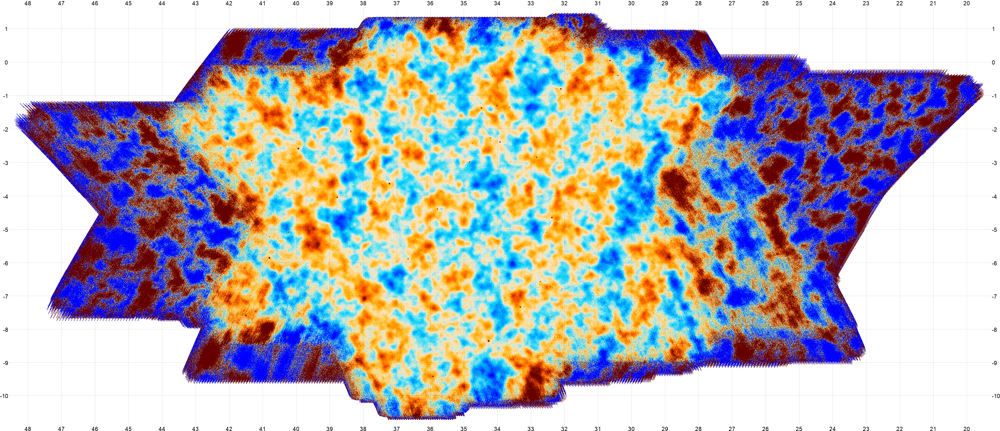

In [11]:
enplot.show(plots)

That's better!

Jupyter notebooks can be limiting though, so what I like to do is to save the image to disk as a PNG file, and use a very nice lightweight Linux tool called `feh` to open it.

In [12]:
enplot.write("plots_example",plots)
# Note: no need to specify the file extension. Also, the plots image can be made from a stack of maps, i.e. maps that have additional leading dimensions.

# Optional
os.system("feh plots_example.png")

0

With feh, you can zoom in and pan around the image in a very intutitive manner, and freeze locations of different map images (with identical footprint) relative to each other. I don't know of a good equivalent of `feh` on Mac OS X, so feel free to drop recommendations on the Issues page.

## Selecting regions of the map
**Because your astronomer friend told you dec=-2.38 deg, ra = 33.92 deg has a little surprise**

Suppose you are interested in an object at 
dec=-2.38 deg, ra = 33.92 deg

and you want to look at a stamp around this location with width 20 arcminutes.

In [13]:
dec,ra = np.deg2rad([-2.38,33.92])
width = np.deg2rad(20./60.)


You can construct a coordinate box for this region using the convention we saw earlier,
[[dec_from,ra_from],[[dec_to,ra_to]]
and use the submap function to create a new ndmap from the orginal full map that extracts this region

In [14]:
box = [[dec-width/2.,ra-width/2.],[dec+width/2.,ra+width/2.]]
stamp = imap.submap(box)

Note that unlike vanilla numpy arrays, ndmaps have additional member functions like submap.

Instead of accessing these functions from the object with the dot operator, they can usually be accessed from the module itself. For example, the above is identical to

```
stamp = enmap.submap(imap,box)
```

Let's plot the stamp with matplotlib

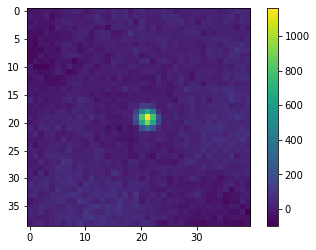

In [15]:
plt.imshow(stamp)
plt.colorbar()

So there was something mildly interesting there after all, a point source! We can also plot it using enplot:

(39, 40) cea:{cdelt:[0.008333,0.008333],crval:[0,0],crpix:[-4049,306],pv[2,1]=1}


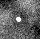

In [16]:
print(stamp.shape,stamp.wcs)
enplot.show(enplot.plot(stamp,grid=False, color='gray'))

Ok, so that's a bit small. That's because enplot by default displays the map *as is*, and does not try to upscale or downgrade it. Let's upgrade the stamp by a factor of 5 to display it.

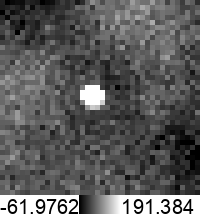

In [17]:
enplot.show(enplot.plot(enmap.upgrade(stamp,5),grid=False, colorbar=True,color='gray'))

To start to get some information out of this source, it would be good to have some handle on the geometry in a way that I don't have to think about things like pixel size. pixell has a ton of utilities for this. For example, I can quickly create a "map of distances from the center" on the same geometry as this stamp with the enmap.modrmap function or equivalently the member function modrmap of the stamp ndmap object.

In [32]:
modrmap = stamp.modrmap() #1
# which is the same as
shape,wcs = stamp.shape, stamp.wcs
modrmap = enmap.modrmap(shape,wcs) #2
# Notice how you can do these calculations either with an existing map (#1) or with a geometry pair shape,wcs (#2) when you don't actually have a map in hand


/home/msyriac/repos/pixell/pixell/enmap.py:495: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if wrap is "auto":
/home/msyriac/repos/pixell/pixell/enmap.py:1491: SyntaxWarning: "is" with a literal. Did you mean "=="?
  else:
/home/msyriac/repos/pixell/pixell/enmap.py:1498: SyntaxWarning: "is" with a literal. Did you mean "=="?
  blanks  = np.array([


The map of distances from the center looks like what you might have expected it to

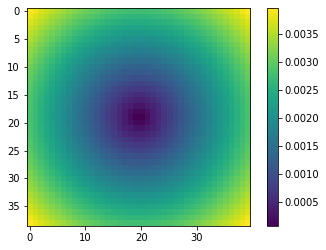

In [33]:
plt.imshow(modrmap)
plt.colorbar()

But this handy map now lets us make quantitive assesments of the original map. For example, I can calculate the mean pixel value within a radius of 2 arcminutes and compare it to the value beyond 2 arcminutes.

In [34]:
radius = np.deg2rad(2./60.)
flux_in = stamp[modrmap<radius].mean()
flux_out = stamp[modrmap>=radius].mean()
print(flux_out,flux_in)

17.128348437583625 186.16326004547523


## Slicing and downgrading

Pretty much any indexing trick you love doing on a numpy array, you can do on an ndmap as well. Most importantly, *the WCS automatically adjusts to it*. Here is an example where we trim off some of the edges of the map.

In [35]:
smap = imap[400:-300,900:-1200]
print(imap.shape,imap.wcs)
print(smap.shape,smap.wcs)

(1505, 3521) cea:{cdelt:[-0.008333,0.008333],crval:[0,0],crpix:[5832,1302],pv[2,1]=1}
(805, 1421) cea:{cdelt:[-0.008333,0.008333],crval:[0,0],crpix:[4932,902],pv[2,1]=1}


Not only did you get a trimmed map, you also had its WCS updated in the process. Let's plot the trimmed map:


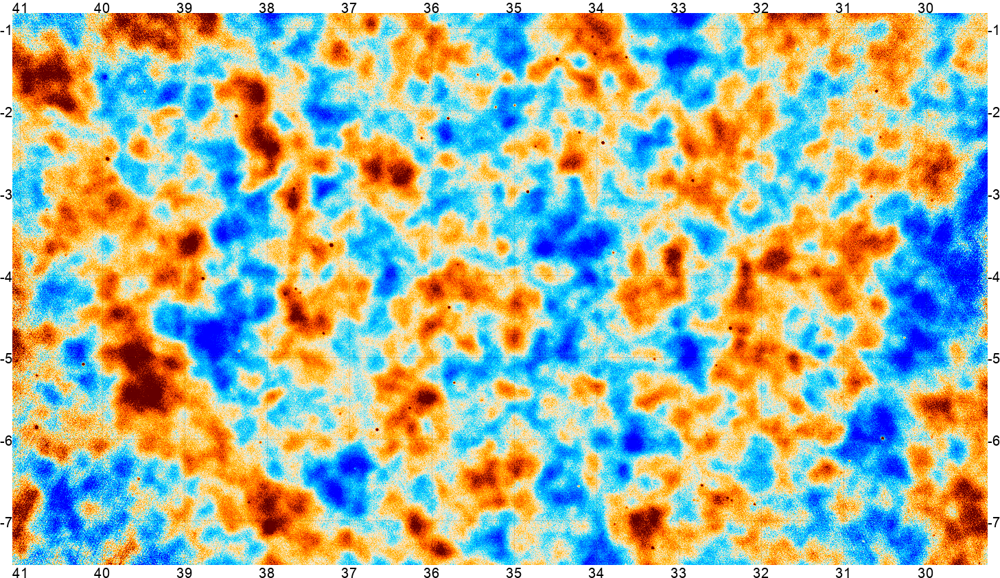

In [36]:
enplot.show(enplot.plot(smap))

Let's downgrade the map by a factor of four. This is done internally through pixel averaging.
*WARNING*: Such operations generally introduce a pixel window function and change the power spectrum of the map, so you'll have to be careful about that when doing precision analysis.

(201, 355) cea:{cdelt:[-0.03333,0.03333],crval:[0,0],crpix:[1233,225.9],pv[2,1]=1}


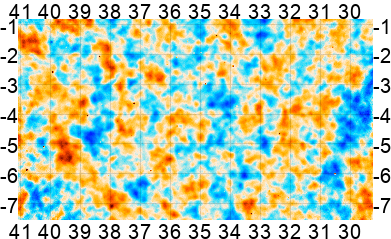

In [37]:
smap = enmap.downgrade(smap,4)
print(smap.shape,smap.wcs)
enplot.show(enplot.plot(smap,range=300))

It's worth reiterating this: the wcs information is correctly adjusted when the array is sliced or downgraded (any numpy index based operation and any pixell function will preserve and adjust wcs correctly ); for example the object returned by imap[:50,:50] is a view into the imap data attached to a new wcs object that correctly describes the footprint of the extracted pixels.

Many functions that act on numpy arrays (e.g. ufuncs) will also apply their operation on the numpy data within the ndmap and return back an ndmap with the same wcs. *Some* functions however (in particular, functions that do a np.asarray(x) on the input array x as opposed to a np.asanyarray(x) ) will destroy/detach the WCS information. In such cases, you can attach the original wcs information back on to the array in one of several ways.

In [67]:
tmap = smap.copy() # let's test it out on a copy of the previous map
print(tmap.shape,tmap.wcs)

(201, 355) cea:{cdelt:[-0.03333,0.03333],crval:[0,0],crpix:[1233,225.9],pv[2,1]=1}


That map has WCS, good. Now let's pass it through a function which acts on numpy arrays and returns a numpy array but sadly destroys the WCS because internally it does a np.asarray(x) on the input array x instead of a np.asanyarray(x).

In [40]:
nmap = np.fft.fftshift(tmap) # This is just an example function that clobbers WCS, don't pay attention to it specifically
print(nmap.shape)
print(nmap.wcs)

(201, 355)


AttributeError: 'numpy.ndarray' object has no attribute 'wcs'

Ok, so you can see I lost my WCS info from that map. But not to worry, there are a couple of ways I can attach it back:

In [42]:
nmap = enmap.samewcs(nmap,tmap)
print(nmap.shape,nmap.wcs)
# or like this
wcs = tmap.wcs
nmap = enmap.ndmap(nmap,wcs)
print(nmap.shape,nmap.wcs)
# or equivalently
nmap = enmap.enmap(nmap,wcs)
print(nmap.shape,nmap.wcs)
# Note that the names ndmap and enmap are used somewhat interchangeably within pixell.

(201, 355) cea:{cdelt:[-0.03333,0.03333],crval:[0,0],crpix:[1233,225.9],pv[2,1]=1}
(201, 355) cea:{cdelt:[-0.03333,0.03333],crval:[0,0],crpix:[1233,225.9],pv[2,1]=1}
(201, 355) cea:{cdelt:[-0.03333,0.03333],crval:[0,0],crpix:[1233,225.9],pv[2,1]=1}


## Apodizing

You will probably know that if we want to do any sort of harmonic analysis (up next), we require periodic boundary conditions. We can prepare an edge taper map on the same footprint as our map of interest smap using the pixell.enmap.apod function.

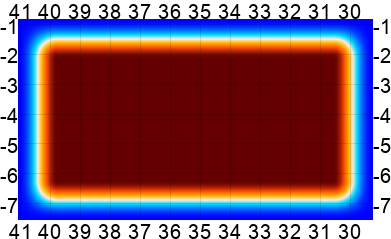

In [43]:
apod_pix=40 # number of pixels at the edge to apodize
taper = enmap.apod(smap*0+1,apod_pix) # I pass in an array of ones the same shape,wcs as smap
enplot.show(enplot.plot(taper))

Applying this to my CMB map makes it have a nice zeroed edge:

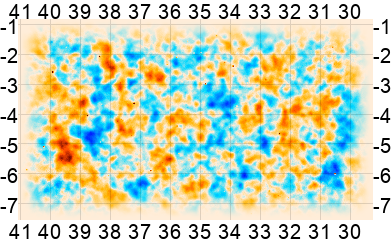

In [44]:
enplot.show(enplot.plot(smap*taper,range=300))

## Fourier transforms and filtering

Now that I have a map that has been prepared for harmonic analysis, I can take harmonic transforms of it that can be used to filter the map or calculate its power spectra. I'll first demonstrate "flat-sky" FFTs, since this patch is fairly close to the equator and not very large. These are much faster and still very accurate. They are also very convenient for applying 2-dimensional filters (e.g. if you wanted to mask out noisy modes that are horizontal or vertical in the map, as would be seen in ground-based CMB experiments).

We first calcualte the FFT of the tapered map, which will return an ndmap which is complex but has the same WCS. One can leave the FFT normalization to the default value as long as later IFFT operations also do so. However, it is very convenient to use the *physical* normalization convention designated within pixell (this is not the default) by passing "phys" to the normalize argument. This ensures that pixel area factors are applied such that the square of the FFT is the power spectrum in units of steradians, such that you don't have to think about pixel area factors when calculating the power. If you use this normalization, just make sure you use it again in any subsequent IFFT operations.

In [45]:
kmap = enmap.fft(smap*taper,normalize="phys")
print(kmap.shape)
print(kmap.wcs)
print(kmap.dtype)

(201, 355)
cea:{cdelt:[-0.03333,0.03333],crval:[0,0],crpix:[1233,225.9],pv[2,1]=1}
complex128


This provides a 2D map of the same shape and wcs as the original real space map, but now the numpy data is a complex 2D array that contains the complex FFT. Each pixel in this map corresponds to a Fourier pixel in the 2D Fourier space.

Great, now that we have the FFT, we can apply a simple filter by multiplying the FFT by a 2D function of our choice. But first we need to know what Fourier frequency values correspond to each Fourier pixel. Just like a real space map would have declination and right ascension values for each pixel, each Fourier pixel will have a corresponding `ly` and `lx` Fourier pixel frequency value. We can obtain this using the `enmap.lmap` function which wraps knowledge of the physical extent of the map around numpy's `np.fft.fftfreq`.



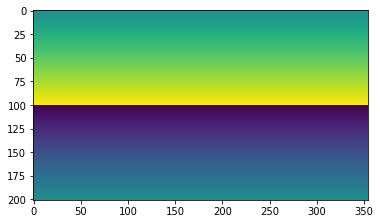

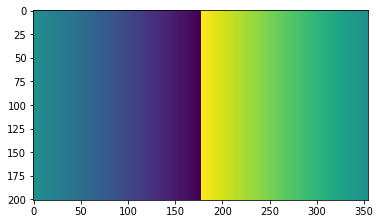

In [48]:
lymap,lxmap = smap.lmap()
plt.imshow(lymap)
plt.show()
plt.imshow(lxmap)
plt.show()

Remember, these are maps of the `ly` and `lx` Fourier frequency in each Fourier pixel of the map.
If you're used to working with FFTs, you'll notice the convention is such that the positive frequencies come first, followed by increasing negative frequencies. You can show these in the more intuitive zero-centered form by using np.fft.fftshift (which as we saw earlier, destroys WCS information, so watch out for that).

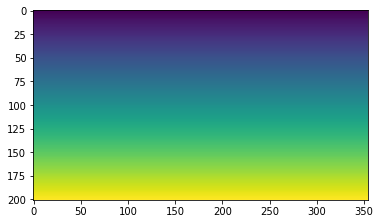

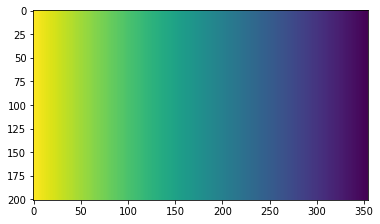

In [50]:
plt.imshow(np.fft.fftshift(lymap)) ; plt.show()
plt.imshow(np.fft.fftshift(lxmap)) ; plt.show()

While Fourier frequencies are better visualized zero-centered (so that fftshift is applied just before and only for plotting), we don't recommend actually ever storing such Fourier frequencies arrays in their shifted form, since that breaks convention and is also just unnecessary as long as you use maps like these to index the Fourier pixels of interest.

Most often you will want to apply *isotropic* operations, which do not distinguish `ly` and `lx`, so for these a map of the magnitude of the distance in Fourier space from zero is useful, which is just the sum of squares of the above. There is a convenience function for this that is very commonly used.

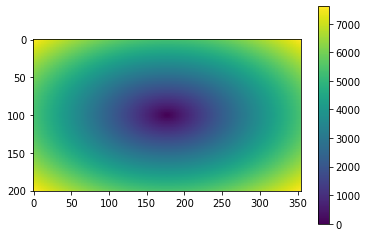

In [53]:
modlmap = smap.modlmap()
plt.imshow(np.fft.fftshift(modlmap)) ; plt.colorbar() ; plt.show()

Ok, let's build a simple isotropic filter that tries to mimic a point source finder. We want to downweight large scales dominated by CMB and downweight small scales dominated by instrument noise to find objects that are roughly a few arcminutes in size.

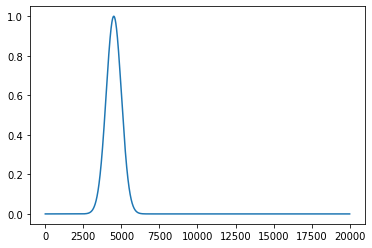

In [54]:
"""
I make my simple filter centered on ell of 4500 with a spread of 500
"""

ells = np.arange(0,20000,1)
ell0 = 4500
ellsig = 500
fl = np.exp(-(ells-ell0)**2./2./ellsig**2.)

# I plot the 1d filter

plt.plot(ells,fl)
plt.show()



I can now interpolate this 1D filter on to the 2D grid using the Fourier distances modlmap.

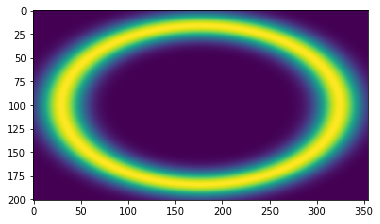

In [55]:
from scipy.interpolate import interp1d

fl2d = interp1d(ells,fl,bounds_error=False,fill_value=0)(modlmap)
plt.imshow(np.fft.fftshift(fl2d))

As desired, this is an isotropic ring that isolates all Fourier modes of rough magnitude around 4500. Now I filter the map by multiplying it's Fourier tranform by this 2D filter, and then inverse FFTing it back with the same normalization I used before.

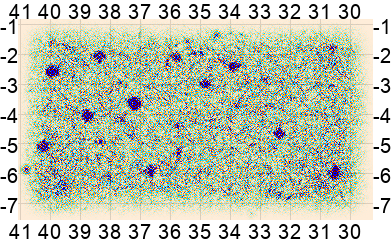

In [57]:
kfiltered = kmap*fl2d
filtered = enmap.ifft(kfiltered,normalize="phys").real

enplot.show(enplot.plot(filtered))

That kind of worked? I seem to have found some regions where point sources live! We can do much better with a proper matched filter, but that's beyond the scope of this tutorial.

## Fourier transforms and naive power spectra

I can calculate the 2D power spectrum by squaring the Fourier transform. Since the normalization was "physical", I don't have to worry about any pixel area scaling factors.

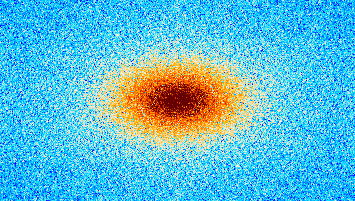

In [59]:
power = (kmap*np.conj(kmap)).real
# I'll FFT shift and log transform the power to visualize it
shifted_power = enmap.samewcs(np.fft.fftshift(np.log10(power)),smap)

enplot.show(enplot.plot(shifted_power,grid=False))

You are looking at the power spectrum of the map. It looks fairly isotropic. This is what you would expect of most things in the map (like the CMB, some part of the instrument noise, extragalactic foregrounds, but not for Galactic foregrounds or for anisotropic instrument noise, ground pickup).

To compare this to theoretical expectations, we have to bin the 2D power spectrum in annuli.

## Binned power spectrum

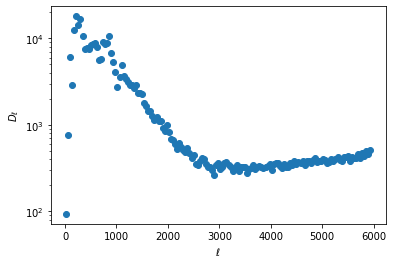

In [63]:
# This is a simple binning function that finds the mean in annular bins defined by bin_edges
def bin(data,modlmap,bin_edges):
    digitized = np.digitize(np.ndarray.flatten(modlmap), bin_edges,right=True)
    return np.bincount(digitized,(data).reshape(-1))[1:-1]/np.bincount(digitized)[1:-1]

bin_edges = np.arange(0,6000,40)
centers = (bin_edges[1:] + bin_edges[:-1])/2.
binned_power = bin(power,modlmap,bin_edges)

plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()

That's looking pretty good! We might even be able to see a hint of acoustic oscillations from the CMB itself. Let's compare this to theory.

## Comparing with theory

pixell's powspec module has utilities to facilitate loading theory C_ells from CAMB outputs. We plot our measurement against it.

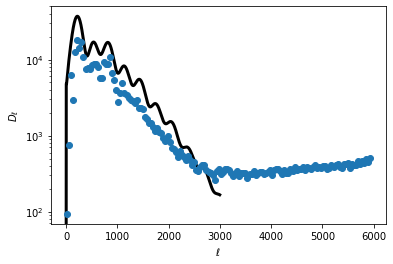

In [64]:
from pixell import powspec
camb_theory = powspec.read_spectrum("camb_theory.dat")
cltt = camb_theory[0,0,:3000]
ls = np.arange(cltt.size)

plt.plot(ls,cltt*ls**2.,lw=3,color='k')
plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()


This looks a bit low. The reason for that is that we have forgotten that we applied a taper to facilitate the Fourier transform. This taper zeroes out a fraction of the map, which means it lowers the average power spectrum of the map. The proper full treatment of this is to also account for the fact that the mask couples different Fourier modes. Knowledge of the mask allows us to decouple this. pixell does not have code to do that; but codes like `namaster`, `pspy` and `pitas` are designed to properly do this, so check those out!

We can however get an approximate correction. Since the power spectrum squares the map, an approximate accounting for the loss in power is:

In [65]:
w2 = np.mean(taper**2.)

Dividing the raw power by this factor gets us much better agreement:

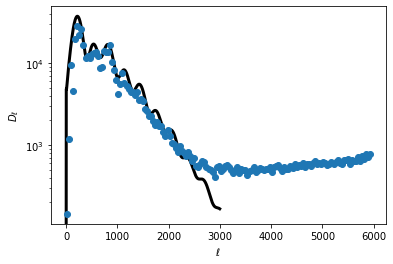

In [66]:

plt.plot(ls,cltt*ls**2.,lw=3,color='k')
plt.plot(centers,centers**2*binned_power / w2,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()

We only recommend such an approach for quick diagnostic power spectra for debugging or exploration, or for applications to situations where the underlying power spectrum is not so red (rapidly falling). For precision analysis, a mask deconvolution algorithm like that in `namaster`, `pspy` or `pitas` should be used.

## Spherical harmonic analysis
NOTE: This section onwards requires you to have a compiled version of pixell.


We'll do this live if there's time.

## Reprojecting a healpix map

A simple way to reproject a healpix map to the same geometry of the rectangular pixel map you are working with is to :
1. spherical harmonic transform the healpix map to alm's
2. inverse spherical harmonic transform the alm's to the rectangular pixel map geometry

The pixell.reproject module has a function that does this. You can also apply a rotation of the coordinate system from Galactic to Equatorial.

In [72]:
from pixell import reproject
pmap = reproject.enmap_from_healpix(planck_file_name, smap.shape, smap.wcs, ncomp=1, unit=1, lmax=6000,rot="gal,equ")

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


/home/msyriac/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:403: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))


Ordering converted to RING
Preparing SHT
T -> alm
float64 complex128
Computing pixel positions
Computing rotated positions
Projecting


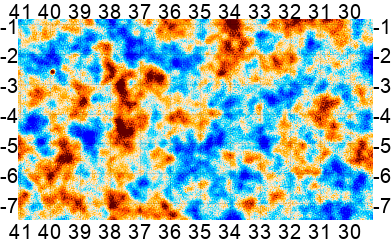

In [73]:
enplot.show(enplot.plot(pmap))

## Cross-correlating Planck with ACT

We can now cross-correlate this map with the ACT map on the same footprint. 

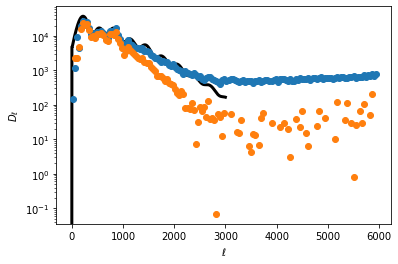

In [94]:
kmap2 = enmap.fft(pmap*taper*1e6,normalize="phys")
cross_power = (kmap*np.conj(kmap2)).real
binned_cross_power = bin(cross_power/w2,modlmap,bin_edges)

plt.plot(ls,cltt*ls**2.,lw=3,color='k')
plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.plot(centers,centers**2*binned_cross_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()

Can you guess why the orange points are so different from the blue points?

## Stacking

We have a nice deep CMB map, and we have a catalog of SZ clusters. Why don't we stack on the location of these clusters to see the average signal?

In [79]:
from astropy.io import fits

hdu = fits.open('E-D56Clusters.fits')
ras = hdu[1].data['RADeg']
decs = hdu[1].data['DECDeg']

# Write code to get stack


## Masking

Mask from source locations

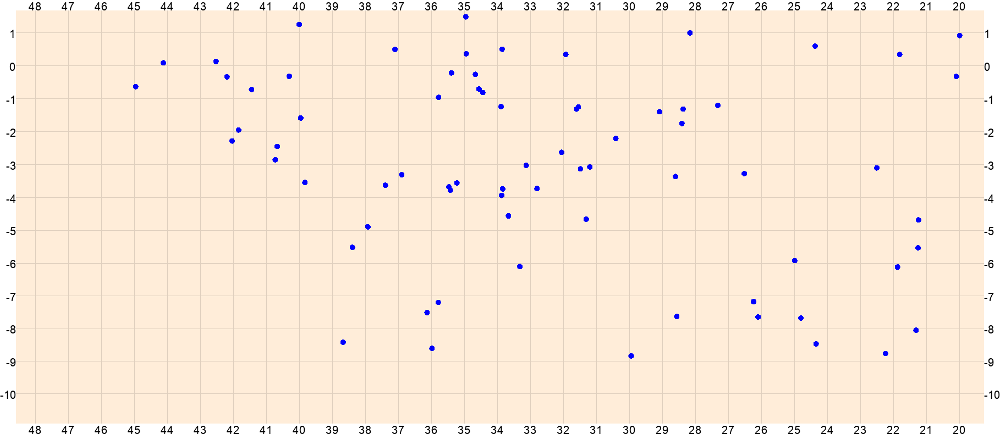

In [100]:
r = np.deg2rad(5./60.)
srcs = np.deg2rad([decs,ras])
dmap = enmap.downgrade(imap,2)
mask = enmap.distance_from(dmap.shape,dmap.wcs,srcs, rmax=r) >= r

enplot.write('imap',enplot.plot(dmap))
enplot.write('mask',enplot.plot(mask))
enplot.show(enplot.plot(mask))


Binary mask from thresholding

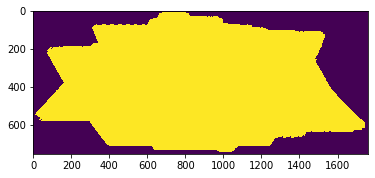

In [102]:
mask = dmap.copy()
mask[np.abs(mask)<1e-3] = 0
mask[np.abs(mask)>1e-3] = 1
plt.imshow(mask) ; plt.show()